In [1]:
!pip install keras==2.2.0

    100% |████████████████████████████████| 307kB 20.1MB/s ta 0:00:01
    100% |████████████████████████████████| 51kB 28.3MB/s ta 0:00:01
tensorflow 1.13.1 has requirement keras-applications>=1.0.6, but you'll have keras-applications 1.0.2 which is incompatible.
tensorflow 1.13.1 has requirement keras-preprocessing>=1.0.5, but you'll have keras-preprocessing 1.0.1 which is incompatible.
  Found existing installation: Keras-Applications 1.0.7
    Uninstalling Keras-Applications-1.0.7:
      Successfully uninstalled Keras-Applications-1.0.7
  Found existing installation: Keras-Preprocessing 1.0.9
    Uninstalling Keras-Preprocessing-1.0.9:
      Successfully uninstalled Keras-Preprocessing-1.0.9
  Found existing installation: Keras 2.2.4
    Uninstalling Keras-2.2.4:
      Successfully uninstalled Keras-2.2.4
You are using pip version 19.0.3, however version 19.1.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [4]:
from __future__ import print_function, division

from keras.applications.vgg19 import VGG19
from keras.layers import Input, Dense, Flatten, Dropout, Reshape
from keras.layers import BatchNormalization, Activation, Conv2D, Conv2DTranspose
from keras.layers.advanced_activations import LeakyReLU
from keras.models import Model
from keras.optimizers import Adam
from keras import models
from keras import layers
from keras import optimizers

from keras.datasets import cifar10
import keras.backend as K
import tensorflow as tf
from tensorflow.python.keras import backend as K
from keras.models import load_model

import matplotlib.pyplot as plt

import sys
import numpy as np

%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [3]:
!pip install keras_vggface

    100% |████████████████████████████████| 51kB 6.5MB/s eta 0:00:01
    100% |████████████████████████████████| 51kB 28.5MB/s ta 0:00:01
  Stored in directory: /tmp/.cache/pip/wheels/72/aa/01/eb7baeb2f6e2d2f0d2aabddb5f01d57fa22fbd019ee2799bf5
Successfully built keras-vggface
keras 2.2.0 has requirement keras-applications==1.0.2, but you'll have keras-applications 1.0.8 which is incompatible.
keras 2.2.0 has requirement keras-preprocessing==1.0.1, but you'll have keras-preprocessing 1.1.0 which is incompatible.
  Found existing installation: Keras-Applications 1.0.2
    Uninstalling Keras-Applications-1.0.2:
      Successfully uninstalled Keras-Applications-1.0.2
  Found existing installation: Keras-Preprocessing 1.0.1
    Uninstalling Keras-Preprocessing-1.0.1:
      Successfully uninstalled Keras-Preprocessing-1.0.1
You are using pip version 19.0.3, however version 19.1.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [5]:
from keras_applications.imagenet_utils import _obtain_input_shape 


In [6]:
from keras_vggface import VGGFace

In [7]:
  vgg_model = VGGFace(include_top=False, input_shape=(64, 64, 3))
  vgg_model.summary()

Instructions for updating:
Colocations handled automatically by placer.
58916864/58909280 [==============================] - 2s 0us/step
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 64, 64, 3)         0         
_________________________________________________________________
conv1_1 (Conv2D)             (None, 64, 64, 64)        1792      
_________________________________________________________________
conv1_2 (Conv2D)             (None, 64, 64, 64)        36928     
_________________________________________________________________
pool1 (MaxPooling2D)         (None, 32, 32, 64)        0         
_________________________________________________________________
conv2_1 (Conv2D)             (None, 32, 32, 128)       73856     
_________________________________________________________________
conv2_2 (Conv2D)             (None, 32, 32, 128)       147584    
_____

In [8]:
  #vgg_model = VGG19(weights = "imagenet",include_top=False, input_shape=(64, 64, 3))

  #t=15
  #while t>0:
    #vgg_model.layers.pop()
    #t=t-1
  #vgg_model.summary()

In [50]:
def get_generator(input_layer):
 
  hid = Dense(128 * 32 * 32, activation='relu')(input_layer)    
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)
  hid = Reshape((32, 32, 128))(hid)

  hid = Conv2D(128, kernel_size=5, strides=1,padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)    
  #hid = Dropout(0.5)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Conv2DTranspose(128, 4, strides=2, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Conv2DTranspose(128, 4, strides=2, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Conv2D(128, kernel_size=5, strides=1, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  #hid = Dropout(0.5)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)

  hid = Conv2D(128, kernel_size=5, strides=1, padding='same')(hid)
  hid = BatchNormalization(momentum=0.9)(hid)
  hid = LeakyReLU(alpha=0.1)(hid)
                      
  hid = Conv2D(3, kernel_size=5, strides=1, padding="same")(hid)
  out = Activation("tanh")(hid)

  model = Model(input_layer, out)
  model.summary()
  
  return model, out

In [51]:
def get_discriminator(input_layer):
  '''
  Requires the input layer as input, outputs the model and the final layer
  '''
  vgg_model = VGGFace(include_top=False, input_shape=(128, 128, 3))
  nb_class = 1
  hidden_dim = 512
  for layer in vgg_model.layers[:9]:
    layer.trainable=False
  last_layer = vgg_model.output
  x = Flatten(name='flatten')(last_layer)
  x = Dense(hidden_dim,name='fc6')(x)
  x = LeakyReLU(alpha=0.1)(x)
  #x = Dense(128,name='fc7')(x)
  #x = LeakyReLU(alpha=0.1)(x)
  out = Dense(nb_class, activation='sigmoid', name='fc8')(x)  

  model = Model(vgg_model.input, out)

  model.summary()

  return model, out

In [52]:
from keras.preprocessing import image

def generate_noise(n_samples, noise_dim):
  X = np.random.normal(0, 1, size=(n_samples, noise_dim))
  return X

def show_imgs(batchidx):
  noise = generate_noise(9, 100)
  gen_imgs = generator.predict(noise)

  fig, axs = plt.subplots(3, 3)
  count = 0
  for i in range(3):
    for j in range(3):
      img = image.array_to_img(gen_imgs[count], scale=True)
      axs[i,j].imshow(img)
      axs[i,j].axis('off')
      count += 1
  plt.show()
  plt.close()

In [53]:
# GAN creation
img_input = Input(shape=(128,128,3))
discriminator, disc_out = get_discriminator(img_input)
discriminator.compile(optimizer=Adam(0.0002, 0.5), loss='binary_crossentropy', metrics=['accuracy'])

discriminator.trainable = False

noise_input = Input(shape=(100,))
generator, gen_out = get_generator(noise_input)

gan_input = Input(shape=(100,))
x = generator(gan_input)
gan_out = discriminator(x)
gan = Model(gan_input, gan_out)
gan.summary()

gan.compile(optimizer=Adam(0.0002, 0.5), loss='binary_crossentropy')

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_19 (InputLayer)        (None, 128, 128, 3)       0         
_________________________________________________________________
conv1_1 (Conv2D)             (None, 128, 128, 64)      1792      
_________________________________________________________________
conv1_2 (Conv2D)             (None, 128, 128, 64)      36928     
_________________________________________________________________
pool1 (MaxPooling2D)         (None, 64, 64, 64)        0         
_________________________________________________________________
conv2_1 (Conv2D)             (None, 64, 64, 128)       73856     
_________________________________________________________________
conv2_2 (Conv2D)             (None, 64, 64, 128)       147584    
_________________________________________________________________
pool2 (MaxPooling2D)         (None, 32, 32, 128)       0         
__________

In [13]:
import os

In [14]:
# Data
BASE_PATH = "../input/celebrities-100k/"
print(os.listdir(BASE_PATH))
#BASE_PATH = base_PATH+ 'celebrities-100k' 
DATASET_LIST_PATH= BASE_PATH + "100k.txt"
print(DATASET_LIST_PATH)



['100k', '100k.txt']
../input/celebrities-100k/100k.txt


In [15]:
DATASET_LIST_PATH


'../input/celebrities-100k/100k.txt'

In [16]:
INPUT_DATA_DIR = BASE_PATH + "100k/100k/"


In [17]:
INPUT_DATA_DIR

'../input/celebrities-100k/100k/100k/'

In [18]:
OUTPUT_DIR = "./"


In [19]:
#MODEL_PATH = BASE_PATH + "models/" + "model_" + str(EPOCH) + ".ckpt"
DATASET = [INPUT_DATA_DIR + str(line).rstrip() for line in open(DATASET_LIST_PATH,"r")]

In [20]:
len(DATASET)

100000

In [21]:
data=DATASET[:10000]

In [22]:
#model_path = '../input/facenet-keras/facenet_keras.h5'
#facenet = load_model(model_path)

In [23]:
#facenet.summary()

In [24]:
import scipy.misc
import scipy.ndimage

In [25]:
#uploading images from folder
images = []
for img_name in data:
    image = scipy.ndimage.imread(img_name, mode="RGB")
    image_resized = scipy.misc.imresize(image,(128,128))
    images.append(image_resized)

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:4: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0.
Use ``matplotlib.pyplot.imread`` instead.
  after removing the cwd from sys.path.
/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:5: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  """


In [26]:
train_x = np.stack(images)

In [27]:
train_x.shape

(10000, 128, 128, 3)

In [28]:
X_train = train_x

In [29]:
X_train = ((X_train)-127.5)/127.5

In [30]:
BATCH_SIZE = 64

# # Get training images
#(X_train, y_train), (X_test, _) = cifar10.load_data()

# S

# Normalize data
 
num_batches = int(X_train.shape[0]/BATCH_SIZE)

In [31]:
X_train.shape

(10000, 128, 128, 3)

In [32]:
import time

/opt/conda/lib/python3.6/site-packages/keras/engine/training.py:478: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


10000/10000 [==============================] - 9s 912us/step
  Epoch:- 1, D LOSS: [0.38776759 0.        ]; Cummulative D_LOSS: [0.38776759 0.        ]
  Epoch: 1, Generator Loss: 1.8282242998098717, Discriminator Loss: [0.5804519 0.       ]


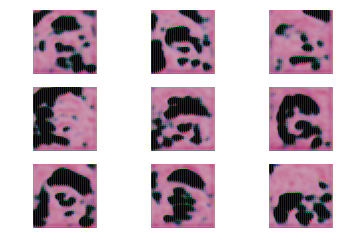

For epoch: 1, Time taken is: 187.5582902431488 seconds
10000/10000 [==============================] - 9s 928us/step
  Epoch:- 2, D LOSS: [0.37371709 0.        ]; Cummulative D_LOSS: [0.76148468 0.        ]
  Epoch: 2, Generator Loss: 2.0309764423813577, Discriminator Loss: [0.3534097 0.       ]


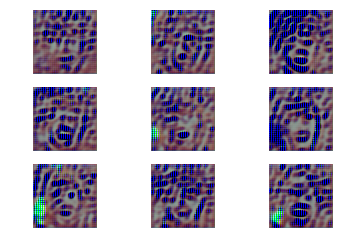

For epoch: 2, Time taken is: 173.17347526550293 seconds
10000/10000 [==============================] - 9s 906us/step
  Epoch:- 3, D LOSS: [0.35048155 0.        ]; Cummulative D_LOSS: [1.11196623 0.        ]
  Epoch: 3, Generator Loss: 2.1788412768107195, Discriminator Loss: [0.3523016 0.       ]


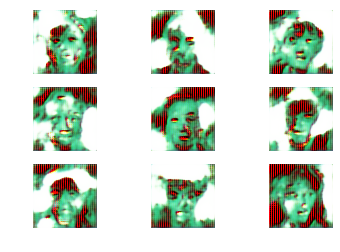

For epoch: 3, Time taken is: 173.2391984462738 seconds
10000/10000 [==============================] - 9s 912us/step
  Epoch:- 4, D LOSS: [0.33408427 0.        ]; Cummulative D_LOSS: [1.4460505 0.       ]
  Epoch: 4, Generator Loss: 2.1384189228216806, Discriminator Loss: [0.35004556 0.        ]


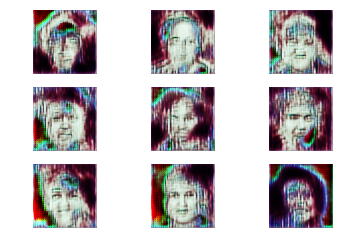

For epoch: 4, Time taken is: 172.74538326263428 seconds
10000/10000 [==============================] - 9s 900us/step
  Epoch:- 5, D LOSS: [0.33787375 0.        ]; Cummulative D_LOSS: [1.78392425 0.        ]
  Epoch: 5, Generator Loss: 2.2662446922980823, Discriminator Loss: [0.35550493 0.        ]


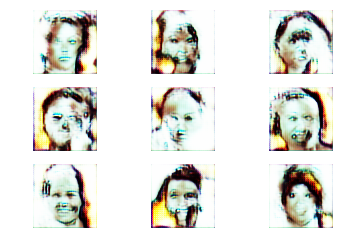

For epoch: 5, Time taken is: 171.72260761260986 seconds
10000/10000 [==============================] - 9s 924us/step
  Epoch:- 6, D LOSS: [0.39231894 0.        ]; Cummulative D_LOSS: [2.17624319 0.        ]
  Epoch: 6, Generator Loss: 2.3355602576182437, Discriminator Loss: [0.3563231 0.       ]


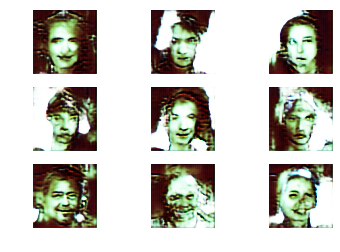

For epoch: 6, Time taken is: 172.73465204238892 seconds
10000/10000 [==============================] - 9s 901us/step
  Epoch:- 7, D LOSS: [0.33084496 0.        ]; Cummulative D_LOSS: [2.50708815 0.        ]
  Epoch: 7, Generator Loss: 2.280872640701441, Discriminator Loss: [0.34912384 0.        ]


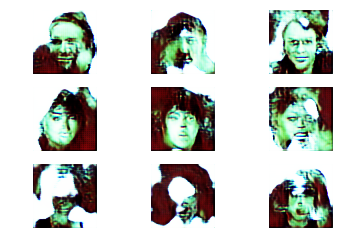

For epoch: 7, Time taken is: 171.98173785209656 seconds
10000/10000 [==============================] - 9s 927us/step
  Epoch:- 8, D LOSS: [0.57369415 0.        ]; Cummulative D_LOSS: [3.0807823 0.       ]
  Epoch: 8, Generator Loss: 2.160508476006679, Discriminator Loss: [0.3361009 0.       ]


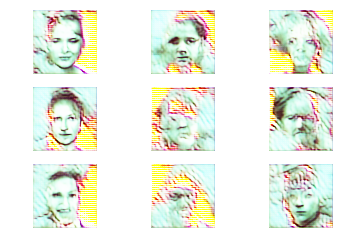

For epoch: 8, Time taken is: 173.01694560050964 seconds
10000/10000 [==============================] - 9s 943us/step
  Epoch:- 9, D LOSS: [0.33147868 0.        ]; Cummulative D_LOSS: [3.41226098 0.        ]
  Epoch: 9, Generator Loss: 2.0690168138497915, Discriminator Loss: [0.35482448 0.        ]


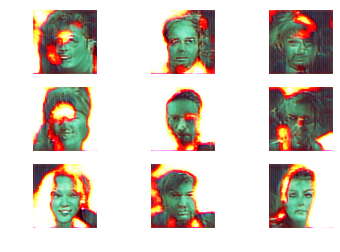

For epoch: 9, Time taken is: 173.38017320632935 seconds
10000/10000 [==============================] - 9s 933us/step
  Epoch:- 10, D LOSS: [0.34499459 0.        ]; Cummulative D_LOSS: [3.75725557 0.        ]
  Epoch: 10, Generator Loss: 2.1887829991487355, Discriminator Loss: [0.35450763 0.        ]


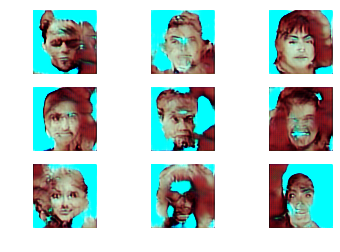

For epoch: 10, Time taken is: 173.6849193572998 seconds
10000/10000 [==============================] - 9s 905us/step
  Epoch:- 11, D LOSS: [0.33916092 0.        ]; Cummulative D_LOSS: [4.09641649 0.        ]
  Epoch: 11, Generator Loss: 2.2232008706300688, Discriminator Loss: [0.3364527 0.       ]


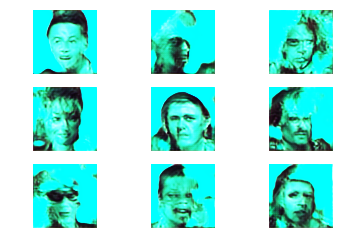

For epoch: 11, Time taken is: 172.9346194267273 seconds
10000/10000 [==============================] - 9s 916us/step
  Epoch:- 12, D LOSS: [0.34479939 0.        ]; Cummulative D_LOSS: [4.44121589 0.        ]
  Epoch: 12, Generator Loss: 2.097323660667126, Discriminator Loss: [0.3420561 0.       ]


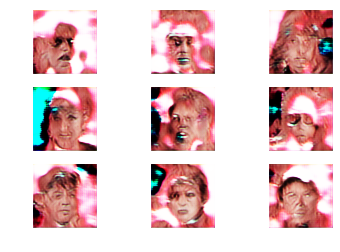

For epoch: 12, Time taken is: 172.9487326145172 seconds
10000/10000 [==============================] - 9s 909us/step
  Epoch:- 13, D LOSS: [0.34021928 0.        ]; Cummulative D_LOSS: [4.78143516 0.        ]
  Epoch: 13, Generator Loss: 2.1842505901287765, Discriminator Loss: [0.3525447 0.       ]


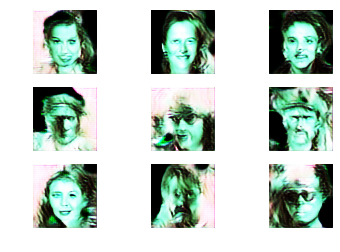

For epoch: 13, Time taken is: 172.73218393325806 seconds
10000/10000 [==============================] - 9s 918us/step
  Epoch:- 14, D LOSS: [0.34491259 0.        ]; Cummulative D_LOSS: [5.12634775 0.        ]
  Epoch: 14, Generator Loss: 2.186554717711913, Discriminator Loss: [0.3544022 0.       ]


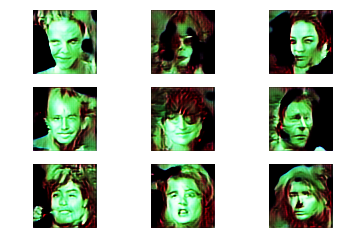

For epoch: 14, Time taken is: 172.77830123901367 seconds
10000/10000 [==============================] - 9s 904us/step
  Epoch:- 15, D LOSS: [0.34684852 0.        ]; Cummulative D_LOSS: [5.47319627 0.        ]
  Epoch: 15, Generator Loss: 2.3391098257822867, Discriminator Loss: [0.3469411 0.       ]


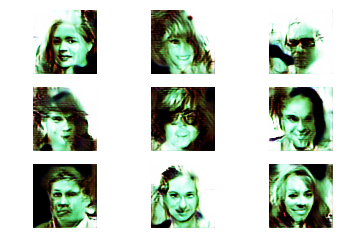

For epoch: 15, Time taken is: 172.55851531028748 seconds
10000/10000 [==============================] - 9s 922us/step
  Epoch:- 16, D LOSS: [0.32853224 0.        ]; Cummulative D_LOSS: [5.80172851 0.        ]
  Epoch: 16, Generator Loss: 2.239278100239925, Discriminator Loss: [0.34239316 0.        ]


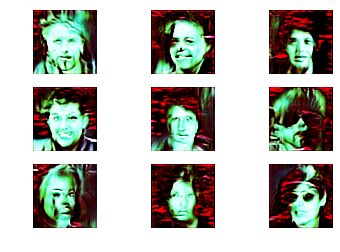

For epoch: 16, Time taken is: 172.82025051116943 seconds
10000/10000 [==============================] - 9s 902us/step
  Epoch:- 17, D LOSS: [0.33892639 0.        ]; Cummulative D_LOSS: [6.1406549 0.       ]
  Epoch: 17, Generator Loss: 2.253632488923195, Discriminator Loss: [0.3374884 0.       ]


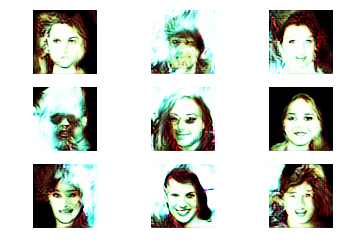

For epoch: 17, Time taken is: 172.473872423172 seconds
10000/10000 [==============================] - 9s 930us/step
  Epoch:- 18, D LOSS: [0.3153104 0.       ]; Cummulative D_LOSS: [6.4559653 0.       ]
  Epoch: 18, Generator Loss: 2.160467747694407, Discriminator Loss: [0.33394718 0.        ]


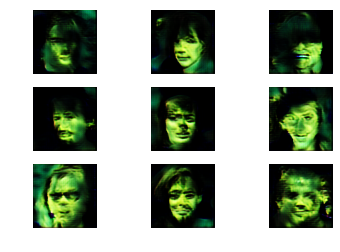

For epoch: 18, Time taken is: 172.77222681045532 seconds
10000/10000 [==============================] - 9s 908us/step
  Epoch:- 19, D LOSS: [0.34688765 0.        ]; Cummulative D_LOSS: [6.80285295 0.        ]
  Epoch: 19, Generator Loss: 2.327322502930959, Discriminator Loss: [0.32831395 0.        ]


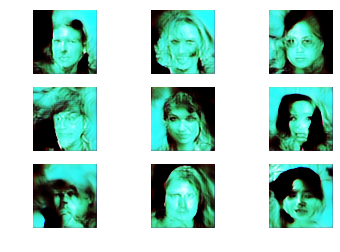

For epoch: 19, Time taken is: 172.60846543312073 seconds
10000/10000 [==============================] - 9s 925us/step
  Epoch:- 20, D LOSS: [0.34188319 0.        ]; Cummulative D_LOSS: [7.14473614 0.        ]
  Epoch: 20, Generator Loss: 2.2771334090293984, Discriminator Loss: [0.3425529 0.       ]


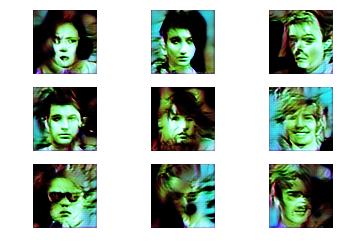

For epoch: 20, Time taken is: 172.05747866630554 seconds
10000/10000 [==============================] - 9s 907us/step
  Epoch:- 21, D LOSS: [0.3141396 0.       ]; Cummulative D_LOSS: [7.45887573 0.        ]
  Epoch: 21, Generator Loss: 2.3278344044318566, Discriminator Loss: [0.3222865 0.       ]


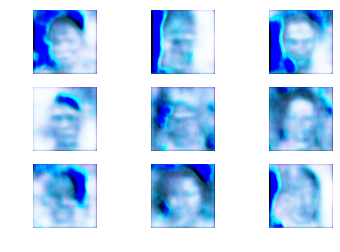

For epoch: 21, Time taken is: 171.82435011863708 seconds
10000/10000 [==============================] - 9s 928us/step
  Epoch:- 22, D LOSS: [0.3499637 0.       ]; Cummulative D_LOSS: [7.80883944 0.        ]
  Epoch: 22, Generator Loss: 2.3528536764475017, Discriminator Loss: [0.32094708 0.        ]


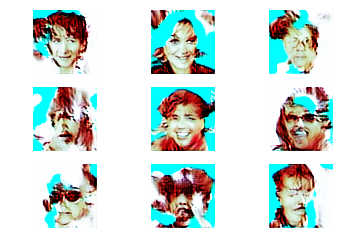

For epoch: 22, Time taken is: 172.03915429115295 seconds
10000/10000 [==============================] - 9s 905us/step
  Epoch:- 23, D LOSS: [0.32725958 0.        ]; Cummulative D_LOSS: [8.13609901 0.        ]
  Epoch: 23, Generator Loss: 2.315062639040825, Discriminator Loss: [0.32312462 0.        ]


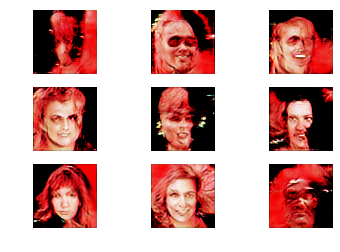

For epoch: 23, Time taken is: 171.79718780517578 seconds
10000/10000 [==============================] - 9s 924us/step
  Epoch:- 24, D LOSS: [0.34070499 0.        ]; Cummulative D_LOSS: [8.476804 0.      ]
  Epoch: 24, Generator Loss: 2.2960267578944182, Discriminator Loss: [0.35044673 0.        ]


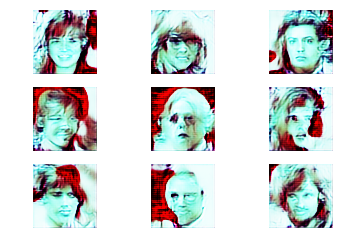

For epoch: 24, Time taken is: 172.06885075569153 seconds
10000/10000 [==============================] - 9s 905us/step
  Epoch:- 25, D LOSS: [0.31767473 0.        ]; Cummulative D_LOSS: [8.79447873 0.        ]
  Epoch: 25, Generator Loss: 2.2706143940106416, Discriminator Loss: [0.33836767 0.        ]


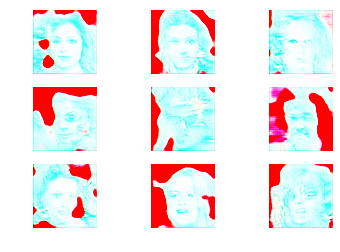

For epoch: 25, Time taken is: 171.64781713485718 seconds
10000/10000 [==============================] - 9s 897us/step
  Epoch:- 26, D LOSS: [0.33107343 0.        ]; Cummulative D_LOSS: [9.12555216 0.        ]
  Epoch: 26, Generator Loss: 2.2806648986461835, Discriminator Loss: [0.33973286 0.        ]


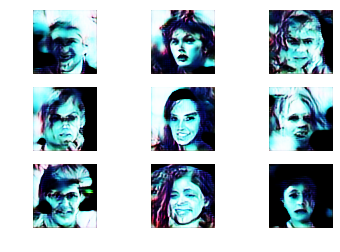

For epoch: 26, Time taken is: 171.32360649108887 seconds
10000/10000 [==============================] - 9s 908us/step
  Epoch:- 27, D LOSS: [0.34284735 0.        ]; Cummulative D_LOSS: [9.46839951 0.        ]
  Epoch: 27, Generator Loss: 2.287671704322864, Discriminator Loss: [0.3411738 0.       ]


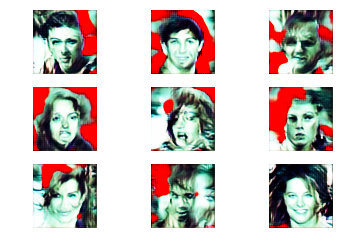

For epoch: 27, Time taken is: 171.32168078422546 seconds
10000/10000 [==============================] - 9s 896us/step
  Epoch:- 28, D LOSS: [0.32676573 0.        ]; Cummulative D_LOSS: [9.79516524 0.        ]
  Epoch: 28, Generator Loss: 2.2027218525226298, Discriminator Loss: [0.34001398 0.        ]


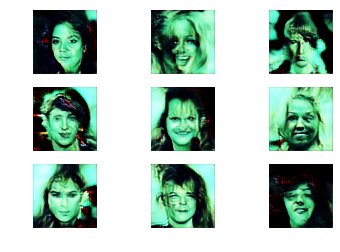

For epoch: 28, Time taken is: 171.22686958312988 seconds
10000/10000 [==============================] - 9s 914us/step
  Epoch:- 29, D LOSS: [0.35692211 0.        ]; Cummulative D_LOSS: [10.15208735  0.        ]
  Epoch: 29, Generator Loss: 2.3044287875676766, Discriminator Loss: [0.33624545 0.        ]


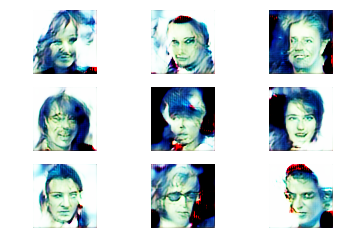

For epoch: 29, Time taken is: 172.32914423942566 seconds
10000/10000 [==============================] - 9s 903us/step
  Epoch:- 30, D LOSS: [0.32664233 0.        ]; Cummulative D_LOSS: [10.47872968  0.        ]
  Epoch: 30, Generator Loss: 2.2907048761844635, Discriminator Loss: [0.33658215 0.        ]


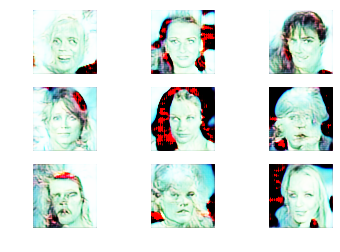

For epoch: 30, Time taken is: 171.61989641189575 seconds
10000/10000 [==============================] - 9s 907us/step
  Epoch:- 31, D LOSS: [0.33035948 0.        ]; Cummulative D_LOSS: [10.80908917  0.        ]
  Epoch: 31, Generator Loss: 2.226444179430986, Discriminator Loss: [0.33393103 0.        ]


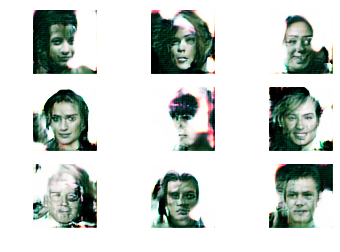

For epoch: 31, Time taken is: 171.6013379096985 seconds
10000/10000 [==============================] - 9s 903us/step
  Epoch:- 32, D LOSS: [0.33289085 0.        ]; Cummulative D_LOSS: [11.14198001  0.        ]
  Epoch: 32, Generator Loss: 2.29292025245153, Discriminator Loss: [0.33369276 0.        ]


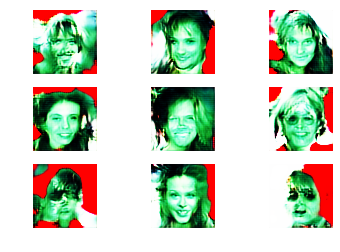

For epoch: 32, Time taken is: 171.28836393356323 seconds
10000/10000 [==============================] - 9s 908us/step
  Epoch:- 33, D LOSS: [0.32433311 0.        ]; Cummulative D_LOSS: [11.46631312  0.        ]
  Epoch: 33, Generator Loss: 2.3018026565894103, Discriminator Loss: [0.3364406 0.       ]


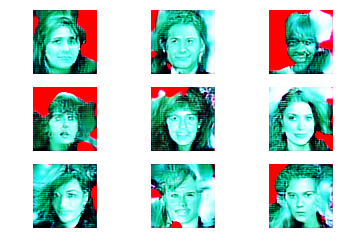

For epoch: 33, Time taken is: 172.45534467697144 seconds
10000/10000 [==============================] - 9s 924us/step
  Epoch:- 34, D LOSS: [0.3632747 0.       ]; Cummulative D_LOSS: [11.82958782  0.        ]
  Epoch: 34, Generator Loss: 2.252224635619384, Discriminator Loss: [0.33746684 0.        ]


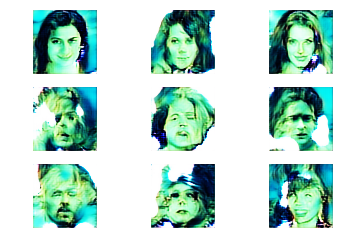

For epoch: 34, Time taken is: 171.61289191246033 seconds
10000/10000 [==============================] - 9s 914us/step
  Epoch:- 35, D LOSS: [0.31811269 0.        ]; Cummulative D_LOSS: [12.14770051  0.        ]
  Epoch: 35, Generator Loss: 2.30618024407289, Discriminator Loss: [0.33367556 0.        ]


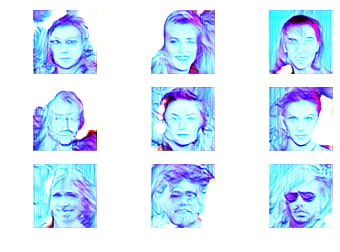

For epoch: 35, Time taken is: 172.5976860523224 seconds
10000/10000 [==============================] - 9s 933us/step
  Epoch:- 36, D LOSS: [0.31943947 0.        ]; Cummulative D_LOSS: [12.46713998  0.        ]
  Epoch: 36, Generator Loss: 2.335413020390731, Discriminator Loss: [0.3287094 0.       ]


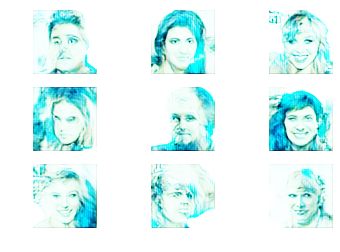

For epoch: 36, Time taken is: 171.80141854286194 seconds
10000/10000 [==============================] - 9s 911us/step
  Epoch:- 37, D LOSS: [0.31974532 0.        ]; Cummulative D_LOSS: [12.7868853  0.       ]
  Epoch: 37, Generator Loss: 2.343312354424061, Discriminator Loss: [0.32844248 0.        ]


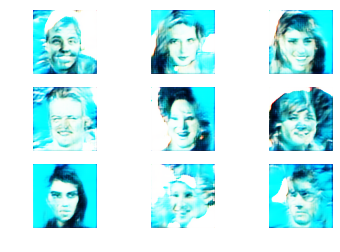

For epoch: 37, Time taken is: 172.57515907287598 seconds
10000/10000 [==============================] - 9s 929us/step
  Epoch:- 38, D LOSS: [0.33985157 0.        ]; Cummulative D_LOSS: [13.12673687  0.        ]
  Epoch: 38, Generator Loss: 2.335350757225966, Discriminator Loss: [0.3290196 0.       ]


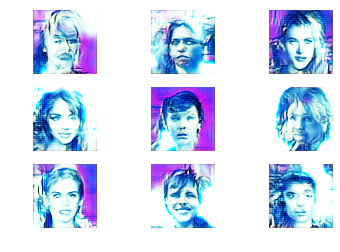

For epoch: 38, Time taken is: 171.81137776374817 seconds
10000/10000 [==============================] - 9s 913us/step
  Epoch:- 39, D LOSS: [0.34606741 0.        ]; Cummulative D_LOSS: [13.47280429  0.        ]
  Epoch: 39, Generator Loss: 2.3324620097111435, Discriminator Loss: [0.33183548 0.        ]


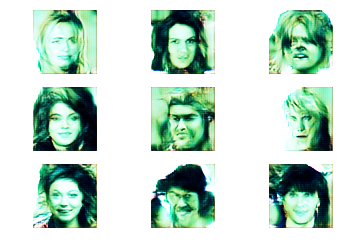

For epoch: 39, Time taken is: 172.43529319763184 seconds
10000/10000 [==============================] - 9s 926us/step
  Epoch:- 40, D LOSS: [0.33581502 0.        ]; Cummulative D_LOSS: [13.80861931  0.        ]
  Epoch: 40, Generator Loss: 2.2965311155869412, Discriminator Loss: [0.33098772 0.        ]


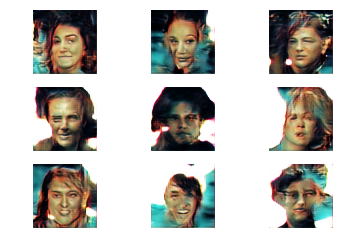

For epoch: 40, Time taken is: 171.6685516834259 seconds
10000/10000 [==============================] - 9s 913us/step
  Epoch:- 41, D LOSS: [0.34750778 0.        ]; Cummulative D_LOSS: [14.15612708  0.        ]
  Epoch: 41, Generator Loss: 2.3340404010736027, Discriminator Loss: [0.33052248 0.        ]


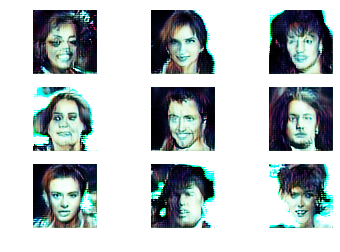

For epoch: 41, Time taken is: 172.42866444587708 seconds
10000/10000 [==============================] - 9s 922us/step
  Epoch:- 42, D LOSS: [0.31924806 0.        ]; Cummulative D_LOSS: [14.47537515  0.        ]
  Epoch: 42, Generator Loss: 2.2387901506362815, Discriminator Loss: [0.3289662 0.       ]


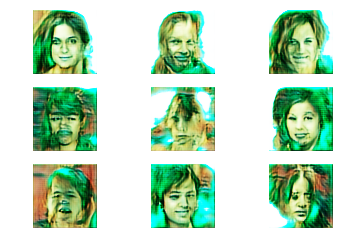

For epoch: 42, Time taken is: 171.69709515571594 seconds
10000/10000 [==============================] - 9s 907us/step
  Epoch:- 43, D LOSS: [0.32208486 0.        ]; Cummulative D_LOSS: [14.79746001  0.        ]
  Epoch: 43, Generator Loss: 2.3670851848064323, Discriminator Loss: [0.32021523 0.        ]


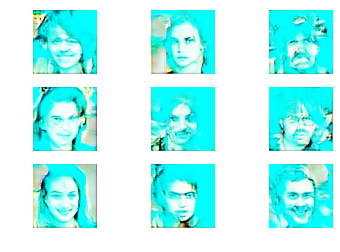

For epoch: 43, Time taken is: 171.92211079597473 seconds
10000/10000 [==============================] - 9s 933us/step
  Epoch:- 44, D LOSS: [0.3405511 0.       ]; Cummulative D_LOSS: [15.13801112  0.        ]
  Epoch: 44, Generator Loss: 2.362274326575108, Discriminator Loss: [0.324571 0.      ]


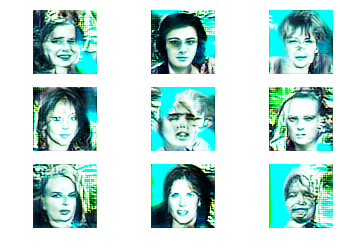

For epoch: 44, Time taken is: 171.8303577899933 seconds
10000/10000 [==============================] - 9s 904us/step
  Epoch:- 45, D LOSS: [0.31881186 0.        ]; Cummulative D_LOSS: [15.45682298  0.        ]
  Epoch: 45, Generator Loss: 2.3577135044794817, Discriminator Loss: [0.33265412 0.        ]


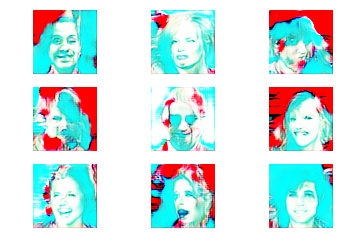

For epoch: 45, Time taken is: 171.91173124313354 seconds
10000/10000 [==============================] - 9s 926us/step
  Epoch:- 46, D LOSS: [0.33341613 0.        ]; Cummulative D_LOSS: [15.7902391  0.       ]
  Epoch: 46, Generator Loss: 2.341380246174641, Discriminator Loss: [0.32777515 0.        ]


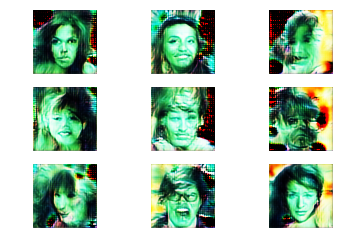

For epoch: 46, Time taken is: 171.63793063163757 seconds
10000/10000 [==============================] - 9s 900us/step
  Epoch:- 47, D LOSS: [0.32633707 0.        ]; Cummulative D_LOSS: [16.11657617  0.        ]
  Epoch: 47, Generator Loss: 2.33527044684459, Discriminator Loss: [0.3345361 0.       ]


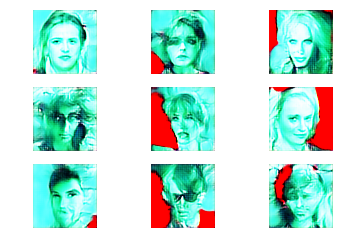

For epoch: 47, Time taken is: 172.0585265159607 seconds
10000/10000 [==============================] - 9s 932us/step
  Epoch:- 48, D LOSS: [0.32454985 0.        ]; Cummulative D_LOSS: [16.44112602  0.        ]
  Epoch: 48, Generator Loss: 2.350997880483285, Discriminator Loss: [0.33072817 0.        ]


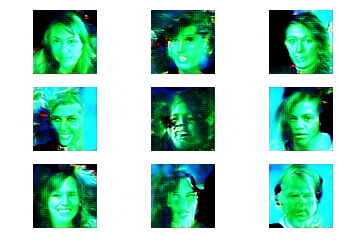

For epoch: 48, Time taken is: 171.6750364303589 seconds
10000/10000 [==============================] - 9s 905us/step
  Epoch:- 49, D LOSS: [0.33184501 0.        ]; Cummulative D_LOSS: [16.77297103  0.        ]
  Epoch: 49, Generator Loss: 2.3247469602487025, Discriminator Loss: [0.33538362 0.        ]


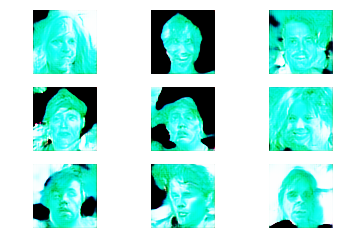

For epoch: 49, Time taken is: 171.84416604042053 seconds
10000/10000 [==============================] - 9s 928us/step
  Epoch:- 50, D LOSS: [0.32836253 0.        ]; Cummulative D_LOSS: [17.10133355  0.        ]
  Epoch: 50, Generator Loss: 2.314428299665451, Discriminator Loss: [0.33540404 0.        ]


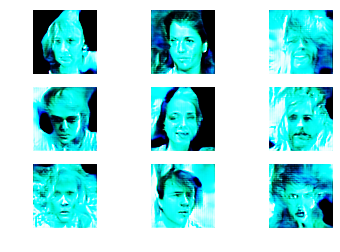

For epoch: 50, Time taken is: 171.68803548812866 seconds
10000/10000 [==============================] - 9s 907us/step
  Epoch:- 51, D LOSS: [0.32395344 0.        ]; Cummulative D_LOSS: [17.425287  0.      ]
  Epoch: 51, Generator Loss: 2.3332455158233643, Discriminator Loss: [0.32755175 0.        ]


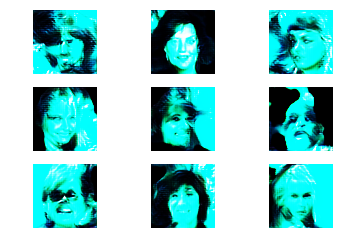

For epoch: 51, Time taken is: 171.93386030197144 seconds
10000/10000 [==============================] - 9s 925us/step
  Epoch:- 52, D LOSS: [0.33387859 0.        ]; Cummulative D_LOSS: [17.75916559  0.        ]
  Epoch: 52, Generator Loss: 2.3299638285086703, Discriminator Loss: [0.3330399 0.       ]


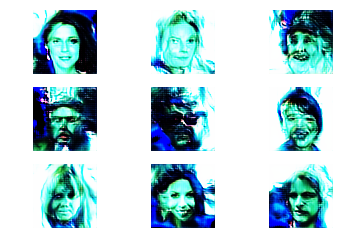

For epoch: 52, Time taken is: 171.58761167526245 seconds
10000/10000 [==============================] - 9s 907us/step
  Epoch:- 53, D LOSS: [3.27690693e-01 5.00000000e-05]; Cummulative D_LOSS: [1.80868563e+01 5.00000000e-05]
  Epoch: 53, Generator Loss: 2.3654426366854935, Discriminator Loss: [0.32314706 0.        ]


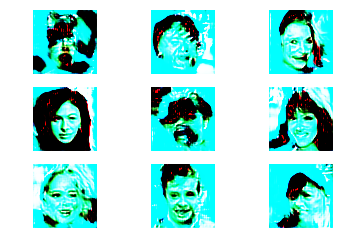

For epoch: 53, Time taken is: 171.82527112960815 seconds
10000/10000 [==============================] - 9s 923us/step
  Epoch:- 54, D LOSS: [0.32240552 0.        ]; Cummulative D_LOSS: [1.84092618e+01 5.00000000e-05]
  Epoch: 54, Generator Loss: 2.3510948419570923, Discriminator Loss: [0.32074913 0.        ]


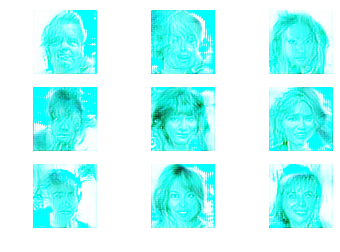

For epoch: 54, Time taken is: 171.65230870246887 seconds
10000/10000 [==============================] - 9s 904us/step
  Epoch:- 55, D LOSS: [0.32056381 0.        ]; Cummulative D_LOSS: [1.87298256e+01 5.00000000e-05]
  Epoch: 55, Generator Loss: 2.3672094375659256, Discriminator Loss: [0.3232723 0.       ]


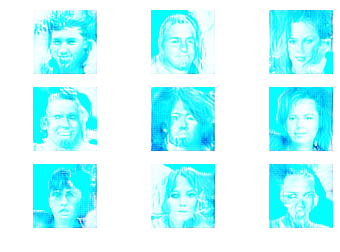

For epoch: 55, Time taken is: 171.82808995246887 seconds
10000/10000 [==============================] - 9s 904us/step
  Epoch:- 56, D LOSS: [0.33312771 0.        ]; Cummulative D_LOSS: [1.90629533e+01 5.00000000e-05]
  Epoch: 56, Generator Loss: 2.364929124330863, Discriminator Loss: [0.323271 0.      ]


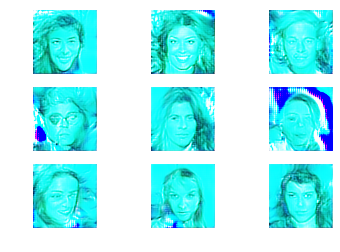

For epoch: 56, Time taken is: 171.38198041915894 seconds
10000/10000 [==============================] - 9s 904us/step
  Epoch:- 57, D LOSS: [0.34267393 0.        ]; Cummulative D_LOSS: [1.94056273e+01 5.00000000e-05]
  Epoch: 57, Generator Loss: 2.3526190305367494, Discriminator Loss: [0.32813942 0.        ]


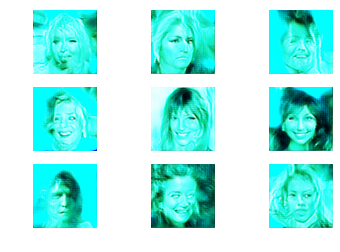

For epoch: 57, Time taken is: 171.3345959186554 seconds
10000/10000 [==============================] - 9s 905us/step
  Epoch:- 58, D LOSS: [0.32328558 0.        ]; Cummulative D_LOSS: [1.97289128e+01 5.00000000e-05]
  Epoch: 58, Generator Loss: 2.346888076036404, Discriminator Loss: [0.32957384 0.        ]


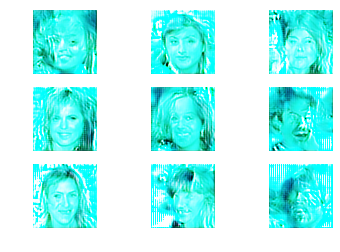

For epoch: 58, Time taken is: 171.49057269096375 seconds
10000/10000 [==============================] - 9s 911us/step
  Epoch:- 59, D LOSS: [0.33249526 0.        ]; Cummulative D_LOSS: [2.00614081e+01 5.00000000e-05]
  Epoch: 59, Generator Loss: 2.366153898911598, Discriminator Loss: [0.3176035 0.       ]


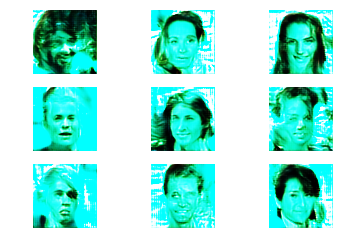

For epoch: 59, Time taken is: 171.88270545005798 seconds
10000/10000 [==============================] - 9s 908us/step
  Epoch:- 60, D LOSS: [0.33419037 0.        ]; Cummulative D_LOSS: [2.03955985e+01 5.00000000e-05]
  Epoch: 60, Generator Loss: 2.3250535680697513, Discriminator Loss: [0.3266388 0.       ]


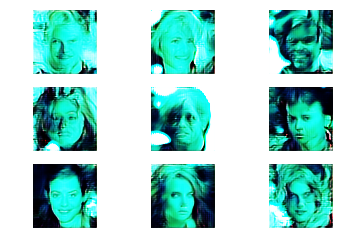

For epoch: 60, Time taken is: 171.6908667087555 seconds
10000/10000 [==============================] - 9s 907us/step
  Epoch:- 61, D LOSS: [0.32368304 0.        ]; Cummulative D_LOSS: [2.07192815e+01 5.00000000e-05]
  Epoch: 61, Generator Loss: 2.350234656761854, Discriminator Loss: [0.3265467 0.       ]


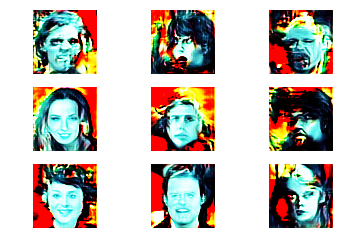

For epoch: 61, Time taken is: 171.62093091011047 seconds
10000/10000 [==============================] - 9s 907us/step
  Epoch:- 62, D LOSS: [0.32707222 0.        ]; Cummulative D_LOSS: [2.10463537e+01 5.00000000e-05]
  Epoch: 62, Generator Loss: 2.3218402480467772, Discriminator Loss: [0.33193254 0.        ]


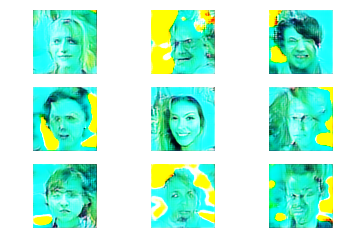

For epoch: 62, Time taken is: 171.73629999160767 seconds
10000/10000 [==============================] - 9s 903us/step
  Epoch:- 63, D LOSS: [0.3272746 0.       ]; Cummulative D_LOSS: [2.13736283e+01 5.00000000e-05]
  Epoch: 63, Generator Loss: 2.355105222799839, Discriminator Loss: [0.32207078 0.        ]


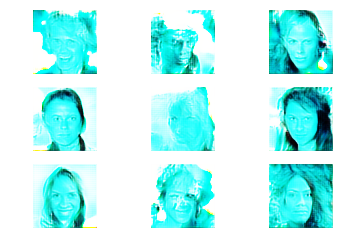

For epoch: 63, Time taken is: 171.5319550037384 seconds
10000/10000 [==============================] - 9s 905us/step
  Epoch:- 64, D LOSS: [0.32480041 0.        ]; Cummulative D_LOSS: [2.16984287e+01 5.00000000e-05]
  Epoch: 64, Generator Loss: 2.354834403747167, Discriminator Loss: [0.3221473 0.       ]


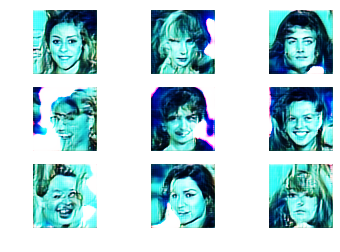

For epoch: 64, Time taken is: 172.18467211723328 seconds
10000/10000 [==============================] - 9s 926us/step
  Epoch:- 65, D LOSS: [0.32468372 0.        ]; Cummulative D_LOSS: [2.20231124e+01 5.00000000e-05]
  Epoch: 65, Generator Loss: 2.33882677478668, Discriminator Loss: [0.32933775 0.        ]


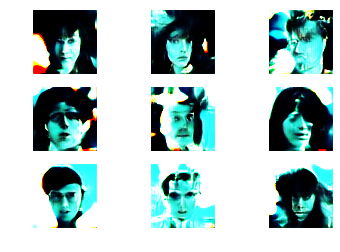

For epoch: 65, Time taken is: 172.28925466537476 seconds
10000/10000 [==============================] - 9s 905us/step
  Epoch:- 66, D LOSS: [0.32850579 0.        ]; Cummulative D_LOSS: [2.23516182e+01 5.00000000e-05]
  Epoch: 66, Generator Loss: 2.336913891327687, Discriminator Loss: [0.32791877 0.        ]


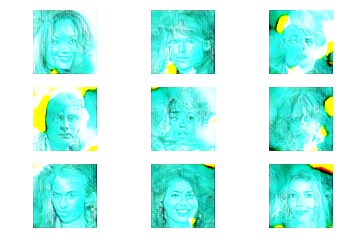

For epoch: 66, Time taken is: 171.9990074634552 seconds
10000/10000 [==============================] - 9s 905us/step
  Epoch:- 67, D LOSS: [0.32977408 0.        ]; Cummulative D_LOSS: [2.26813923e+01 5.00000000e-05]
  Epoch: 67, Generator Loss: 2.3434589749727492, Discriminator Loss: [0.32964292 0.        ]


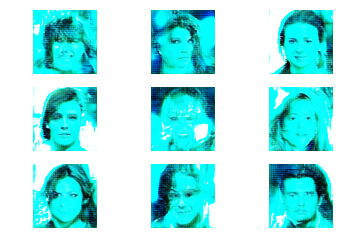

For epoch: 67, Time taken is: 171.51398134231567 seconds
10000/10000 [==============================] - 9s 908us/step
  Epoch:- 68, D LOSS: [0.32082069 0.        ]; Cummulative D_LOSS: [2.3002213e+01 5.0000000e-05]
  Epoch: 68, Generator Loss: 2.3437137741308947, Discriminator Loss: [0.32781067 0.        ]


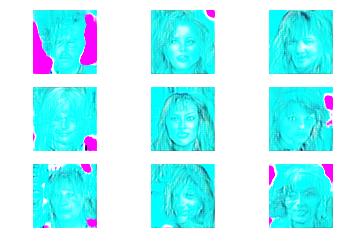

For epoch: 68, Time taken is: 171.99755883216858 seconds
10000/10000 [==============================] - 9s 900us/step
  Epoch:- 69, D LOSS: [0.31688517 0.        ]; Cummulative D_LOSS: [2.33190982e+01 5.00000000e-05]
  Epoch: 69, Generator Loss: 2.3502906606747556, Discriminator Loss: [0.32350042 0.        ]


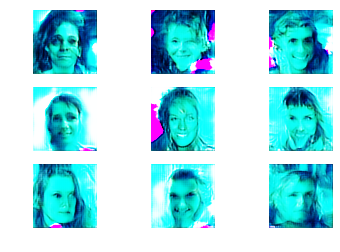

For epoch: 69, Time taken is: 171.3025062084198 seconds
10000/10000 [==============================] - 9s 903us/step
  Epoch:- 70, D LOSS: [0.33795394 0.        ]; Cummulative D_LOSS: [2.36570521e+01 5.00000000e-05]
  Epoch: 70, Generator Loss: 2.3558496893980565, Discriminator Loss: [0.32573885 0.        ]


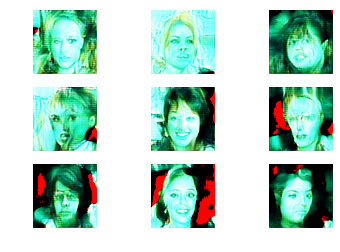

For epoch: 70, Time taken is: 171.93247365951538 seconds
10000/10000 [==============================] - 9s 904us/step
  Epoch:- 71, D LOSS: [0.34108436 0.        ]; Cummulative D_LOSS: [2.39981365e+01 5.00000000e-05]
  Epoch: 71, Generator Loss: 2.3513640570334897, Discriminator Loss: [0.32554394 0.        ]


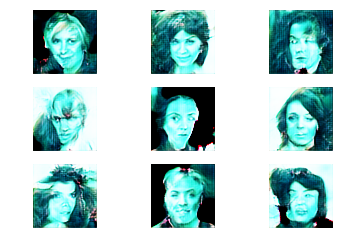

For epoch: 71, Time taken is: 171.3843536376953 seconds
10000/10000 [==============================] - 9s 904us/step
  Epoch:- 72, D LOSS: [0.32759625 0.        ]; Cummulative D_LOSS: [2.43257327e+01 5.00000000e-05]
  Epoch: 72, Generator Loss: 2.333997286283053, Discriminator Loss: [0.3249434 0.       ]


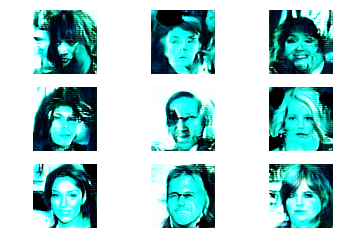

For epoch: 72, Time taken is: 171.92235279083252 seconds
10000/10000 [==============================] - 9s 906us/step
  Epoch:- 73, D LOSS: [0.33650877 0.        ]; Cummulative D_LOSS: [2.46622415e+01 5.00000000e-05]
  Epoch: 73, Generator Loss: 2.3606733037875247, Discriminator Loss: [0.3265635 0.       ]


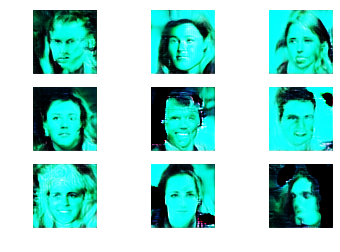

For epoch: 73, Time taken is: 171.42809104919434 seconds
10000/10000 [==============================] - 9s 909us/step
  Epoch:- 74, D LOSS: [0.32767108 0.        ]; Cummulative D_LOSS: [2.49899126e+01 5.00000000e-05]
  Epoch: 74, Generator Loss: 2.340108411434369, Discriminator Loss: [0.32541528 0.        ]


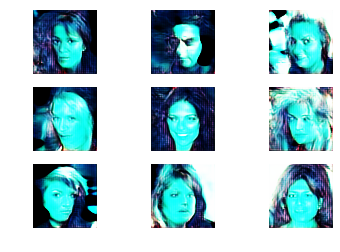

For epoch: 74, Time taken is: 171.94905257225037 seconds
10000/10000 [==============================] - 9s 902us/step
  Epoch:- 75, D LOSS: [0.32246782 0.        ]; Cummulative D_LOSS: [2.53123804e+01 5.00000000e-05]
  Epoch: 75, Generator Loss: 2.3543993601432214, Discriminator Loss: [0.3165333 0.       ]


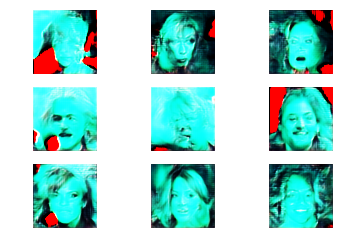

For epoch: 75, Time taken is: 171.07743954658508 seconds
10000/10000 [==============================] - 9s 903us/step
  Epoch:- 76, D LOSS: [0.32375259 0.        ]; Cummulative D_LOSS: [2.5636133e+01 5.0000000e-05]
  Epoch: 76, Generator Loss: 2.3642986042377276, Discriminator Loss: [0.3272455 0.       ]


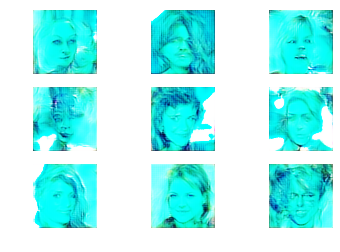

For epoch: 76, Time taken is: 171.79603338241577 seconds
10000/10000 [==============================] - 9s 901us/step
  Epoch:- 77, D LOSS: [0.32860662 0.        ]; Cummulative D_LOSS: [2.59647396e+01 5.00000000e-05]
  Epoch: 77, Generator Loss: 2.36534894658969, Discriminator Loss: [0.32374913 0.        ]


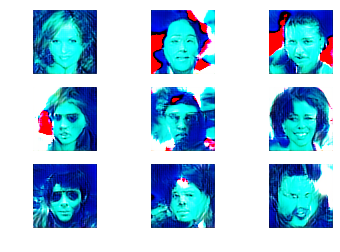

For epoch: 77, Time taken is: 171.15193843841553 seconds
10000/10000 [==============================] - 9s 907us/step
  Epoch:- 78, D LOSS: [0.32494839 0.        ]; Cummulative D_LOSS: [2.6289688e+01 5.0000000e-05]
  Epoch: 78, Generator Loss: 2.3656524007137003, Discriminator Loss: [0.31806248 0.        ]


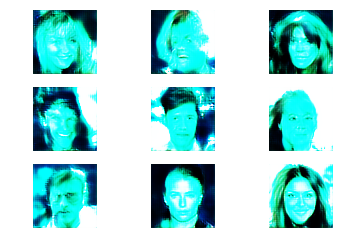

For epoch: 78, Time taken is: 171.96343731880188 seconds
10000/10000 [==============================] - 9s 905us/step
  Epoch:- 79, D LOSS: [0.32627655 0.        ]; Cummulative D_LOSS: [2.66159645e+01 5.00000000e-05]
  Epoch: 79, Generator Loss: 2.3524984442270718, Discriminator Loss: [0.32289347 0.        ]


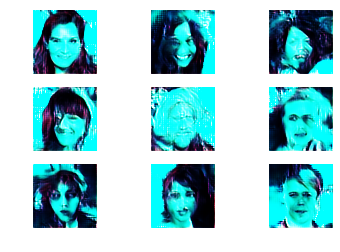

For epoch: 79, Time taken is: 171.3551468849182 seconds
10000/10000 [==============================] - 9s 910us/step
  Epoch:- 80, D LOSS: [0.32054741 0.        ]; Cummulative D_LOSS: [2.69365119e+01 5.00000000e-05]
  Epoch: 80, Generator Loss: 2.3753070877148557, Discriminator Loss: [0.31674632 0.        ]


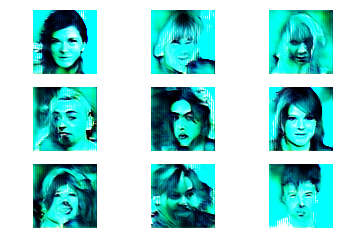

For epoch: 80, Time taken is: 171.88018822669983 seconds
10000/10000 [==============================] - 9s 907us/step
  Epoch:- 81, D LOSS: [0.33231097 0.        ]; Cummulative D_LOSS: [2.72688229e+01 5.00000000e-05]
  Epoch: 81, Generator Loss: 2.3597308137477975, Discriminator Loss: [0.32235914 0.        ]


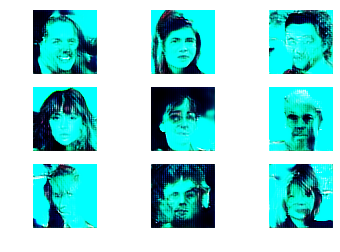

For epoch: 81, Time taken is: 171.30469751358032 seconds
10000/10000 [==============================] - 9s 905us/step
  Epoch:- 82, D LOSS: [0.32988004 0.        ]; Cummulative D_LOSS: [2.7598703e+01 5.0000000e-05]
  Epoch: 82, Generator Loss: 2.3733828021929813, Discriminator Loss: [0.3206886 0.       ]


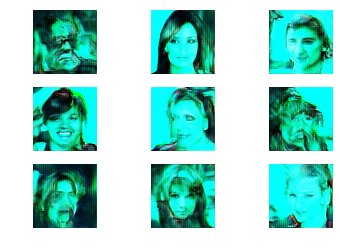

For epoch: 82, Time taken is: 171.8647780418396 seconds
10000/10000 [==============================] - 9s 927us/step
  Epoch:- 83, D LOSS: [0.33628917 0.        ]; Cummulative D_LOSS: [2.79349921e+01 5.00000000e-05]
  Epoch: 83, Generator Loss: 2.3469721170572133, Discriminator Loss: [0.32879126 0.        ]


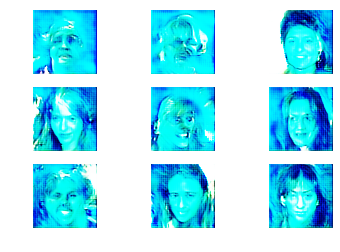

For epoch: 83, Time taken is: 171.22033548355103 seconds
10000/10000 [==============================] - 9s 908us/step
  Epoch:- 84, D LOSS: [0.3282321 0.       ]; Cummulative D_LOSS: [2.82632242e+01 5.00000000e-05]
  Epoch: 84, Generator Loss: 2.3665363437090163, Discriminator Loss: [0.3197787 0.       ]


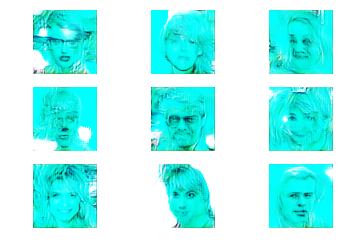

For epoch: 84, Time taken is: 171.93549394607544 seconds
10000/10000 [==============================] - 9s 897us/step
  Epoch:- 85, D LOSS: [0.32605288 0.        ]; Cummulative D_LOSS: [2.85892771e+01 5.00000000e-05]
  Epoch: 85, Generator Loss: 2.356352075552329, Discriminator Loss: [0.32172263 0.        ]


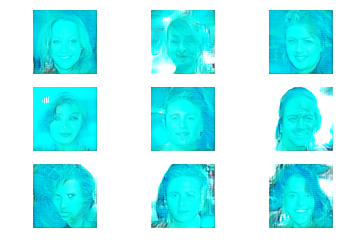

For epoch: 85, Time taken is: 171.79334115982056 seconds
10000/10000 [==============================] - 9s 907us/step
  Epoch:- 86, D LOSS: [0.32169188 0.        ]; Cummulative D_LOSS: [2.8910969e+01 5.0000000e-05]
  Epoch: 86, Generator Loss: 2.352795374699128, Discriminator Loss: [0.32780465 0.        ]


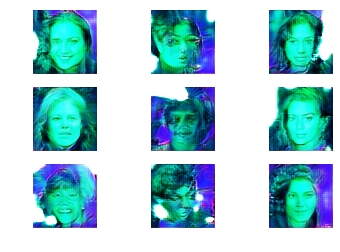

For epoch: 86, Time taken is: 172.22002816200256 seconds
10000/10000 [==============================] - 9s 898us/step
  Epoch:- 87, D LOSS: [0.33235436 0.        ]; Cummulative D_LOSS: [2.92433233e+01 5.00000000e-05]
  Epoch: 87, Generator Loss: 2.3425681629242043, Discriminator Loss: [0.3287757 0.       ]


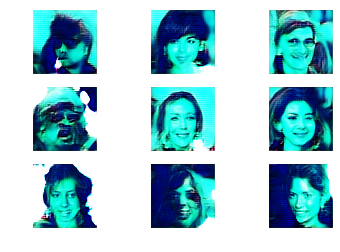

For epoch: 87, Time taken is: 171.76177859306335 seconds
10000/10000 [==============================] - 9s 915us/step
  Epoch:- 88, D LOSS: [0.33772152 0.        ]; Cummulative D_LOSS: [2.95810449e+01 5.00000000e-05]
  Epoch: 88, Generator Loss: 2.329413033448733, Discriminator Loss: [0.33144987 0.        ]


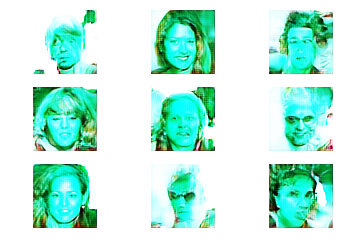

For epoch: 88, Time taken is: 172.28558444976807 seconds
10000/10000 [==============================] - 9s 896us/step
  Epoch:- 89, D LOSS: [0.33174244 0.        ]; Cummulative D_LOSS: [2.99127873e+01 5.00000000e-05]
  Epoch: 89, Generator Loss: 2.348801328585698, Discriminator Loss: [0.32686213 0.        ]


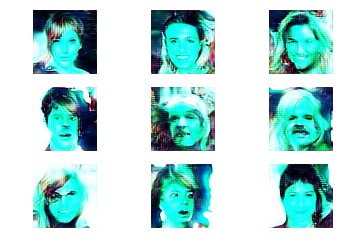

For epoch: 89, Time taken is: 171.67074179649353 seconds
10000/10000 [==============================] - 9s 910us/step
  Epoch:- 90, D LOSS: [0.32213356 0.        ]; Cummulative D_LOSS: [3.02349209e+01 5.00000000e-05]
  Epoch: 90, Generator Loss: 2.3830984311226087, Discriminator Loss: [0.3196025 0.       ]


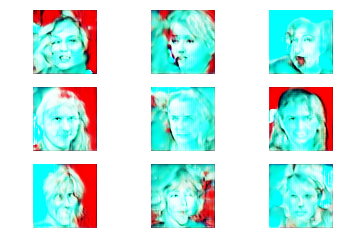

For epoch: 90, Time taken is: 172.14891028404236 seconds
10000/10000 [==============================] - 9s 896us/step
  Epoch:- 91, D LOSS: [0.32356351 0.        ]; Cummulative D_LOSS: [3.05584844e+01 5.00000000e-05]
  Epoch: 91, Generator Loss: 2.341467397335248, Discriminator Loss: [0.32117933 0.        ]


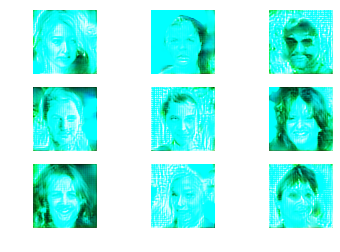

For epoch: 91, Time taken is: 172.0113422870636 seconds
10000/10000 [==============================] - 9s 906us/step
  Epoch:- 92, D LOSS: [0.32946978 0.        ]; Cummulative D_LOSS: [3.08879542e+01 5.00000000e-05]
  Epoch: 92, Generator Loss: 2.345205776202373, Discriminator Loss: [0.3225622 0.       ]


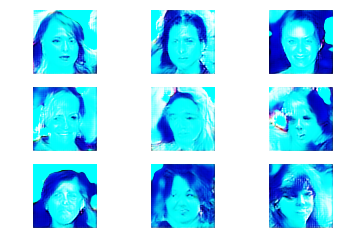

For epoch: 92, Time taken is: 172.26702427864075 seconds
10000/10000 [==============================] - 9s 895us/step
  Epoch:- 93, D LOSS: [0.34350599 0.        ]; Cummulative D_LOSS: [3.12314601e+01 5.00000000e-05]
  Epoch: 93, Generator Loss: 2.3315395223788724, Discriminator Loss: [0.32655373 0.        ]


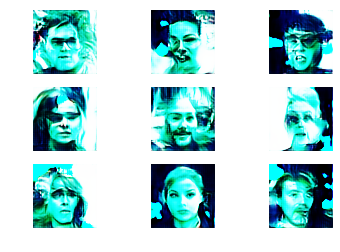

For epoch: 93, Time taken is: 171.88240551948547 seconds
10000/10000 [==============================] - 9s 905us/step
  Epoch:- 94, D LOSS: [0.33024931 0.        ]; Cummulative D_LOSS: [3.15617095e+01 5.00000000e-05]
  Epoch: 94, Generator Loss: 2.336064499158126, Discriminator Loss: [0.32712364 0.        ]


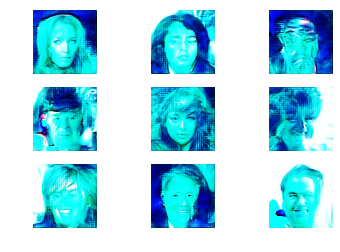

For epoch: 94, Time taken is: 172.40641164779663 seconds
10000/10000 [==============================] - 9s 902us/step
  Epoch:- 95, D LOSS: [0.32053531 0.        ]; Cummulative D_LOSS: [3.18822448e+01 5.00000000e-05]
  Epoch: 95, Generator Loss: 2.3236280649136276, Discriminator Loss: [0.32887426 0.        ]


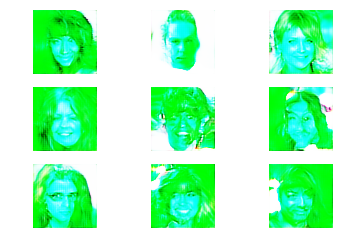

For epoch: 95, Time taken is: 172.68380403518677 seconds
10000/10000 [==============================] - 9s 916us/step
  Epoch:- 96, D LOSS: [0.32485443 0.        ]; Cummulative D_LOSS: [3.22070992e+01 5.00000000e-05]
  Epoch: 96, Generator Loss: 2.3395603589522533, Discriminator Loss: [0.32595232 0.        ]


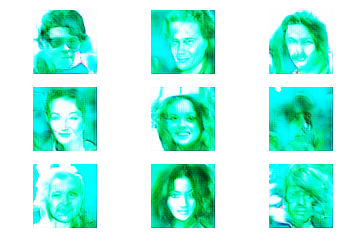

For epoch: 96, Time taken is: 172.4966905117035 seconds
10000/10000 [==============================] - 9s 906us/step
  Epoch:- 97, D LOSS: [0.33342674 0.        ]; Cummulative D_LOSS: [3.25405259e+01 5.00000000e-05]
  Epoch: 97, Generator Loss: 2.3463910130354075, Discriminator Loss: [0.32324332 0.        ]


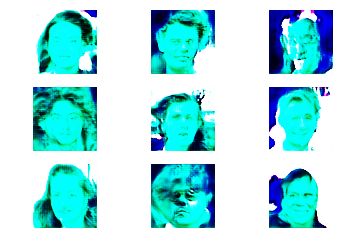

For epoch: 97, Time taken is: 172.30442547798157 seconds
10000/10000 [==============================] - 9s 913us/step
  Epoch:- 98, D LOSS: [0.3248806 0.       ]; Cummulative D_LOSS: [3.28654065e+01 5.00000000e-05]
  Epoch: 98, Generator Loss: 2.3318356627073045, Discriminator Loss: [0.32579678 0.        ]


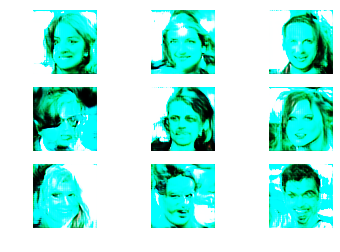

For epoch: 98, Time taken is: 172.66060829162598 seconds
10000/10000 [==============================] - 9s 905us/step
  Epoch:- 99, D LOSS: [0.32190429 0.        ]; Cummulative D_LOSS: [3.31873108e+01 5.00000000e-05]
  Epoch: 99, Generator Loss: 2.366356664743179, Discriminator Loss: [0.32463324 0.        ]


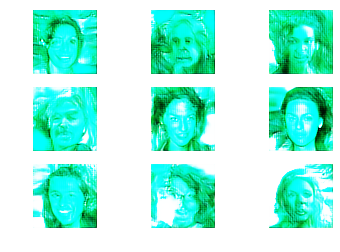

For epoch: 99, Time taken is: 172.24348044395447 seconds
10000/10000 [==============================] - 9s 911us/step
  Epoch:- 100, D LOSS: [0.32371657 0.        ]; Cummulative D_LOSS: [3.35110274e+01 5.00000000e-05]
  Epoch: 100, Generator Loss: 2.3610967504672513, Discriminator Loss: [0.31686667 0.        ]


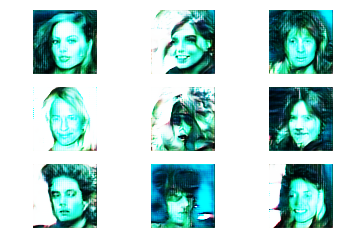

For epoch: 100, Time taken is: 172.45912671089172 seconds
10000/10000 [==============================] - 9s 903us/step
  Epoch:- 101, D LOSS: [0.32254986 0.        ]; Cummulative D_LOSS: [3.38335772e+01 5.00000000e-05]
  Epoch: 101, Generator Loss: 2.328735886475979, Discriminator Loss: [0.32420465 0.        ]


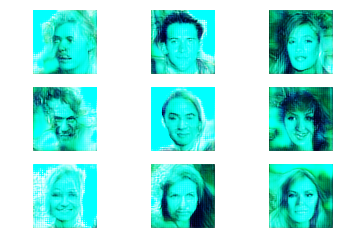

For epoch: 101, Time taken is: 172.007465839386 seconds
10000/10000 [==============================] - 9s 913us/step
  Epoch:- 102, D LOSS: [0.32184664 0.        ]; Cummulative D_LOSS: [3.41554239e+01 5.00000000e-05]
  Epoch: 102, Generator Loss: 2.3380630986812787, Discriminator Loss: [0.32266343 0.        ]


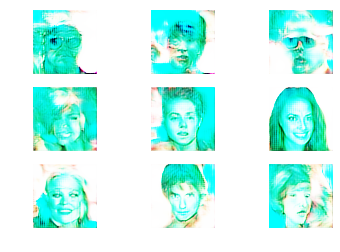

For epoch: 102, Time taken is: 172.4912302494049 seconds
10000/10000 [==============================] - 9s 901us/step
  Epoch:- 103, D LOSS: [0.32482056 0.        ]; Cummulative D_LOSS: [3.44802444e+01 5.00000000e-05]
  Epoch: 103, Generator Loss: 2.3522916573744554, Discriminator Loss: [0.3250256 0.       ]


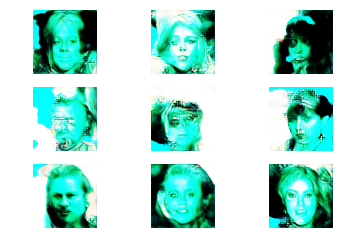

For epoch: 103, Time taken is: 172.22606420516968 seconds
10000/10000 [==============================] - 9s 914us/step
  Epoch:- 104, D LOSS: [0.32060778 0.        ]; Cummulative D_LOSS: [3.48008522e+01 5.00000000e-05]
  Epoch: 104, Generator Loss: 2.364108842152816, Discriminator Loss: [0.321973 0.      ]


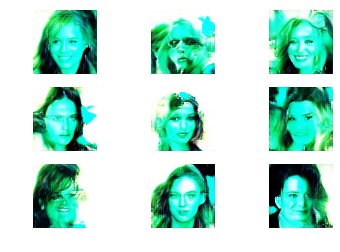

For epoch: 104, Time taken is: 172.70444750785828 seconds
10000/10000 [==============================] - 9s 905us/step
  Epoch:- 105, D LOSS: [0.31703556 0.        ]; Cummulative D_LOSS: [3.51178878e+01 5.00000000e-05]
  Epoch: 105, Generator Loss: 2.3645452765318065, Discriminator Loss: [0.31657007 0.        ]


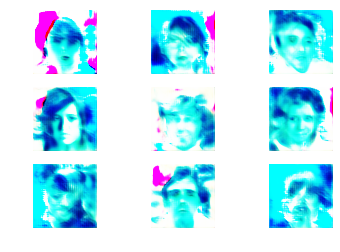

For epoch: 105, Time taken is: 172.4024693965912 seconds
10000/10000 [==============================] - 9s 908us/step
  Epoch:- 106, D LOSS: [0.31655569 0.        ]; Cummulative D_LOSS: [3.54344435e+01 5.00000000e-05]
  Epoch: 106, Generator Loss: 2.3783387541770935, Discriminator Loss: [0.3121982 0.       ]


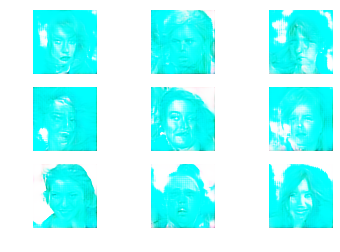

For epoch: 106, Time taken is: 172.4671275615692 seconds
10000/10000 [==============================] - 9s 902us/step
  Epoch:- 107, D LOSS: [0.32069898 0.        ]; Cummulative D_LOSS: [3.57551425e+01 5.00000000e-05]
  Epoch: 107, Generator Loss: 2.376811887973394, Discriminator Loss: [0.31299812 0.        ]


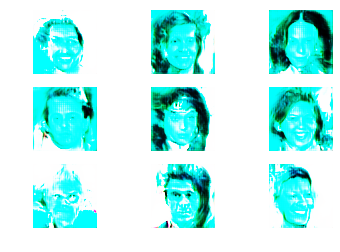

For epoch: 107, Time taken is: 172.3888590335846 seconds
10000/10000 [==============================] - 9s 914us/step
  Epoch:- 108, D LOSS: [0.32483412 0.        ]; Cummulative D_LOSS: [3.60799766e+01 5.00000000e-05]
  Epoch: 108, Generator Loss: 2.371257190520947, Discriminator Loss: [0.31578332 0.        ]


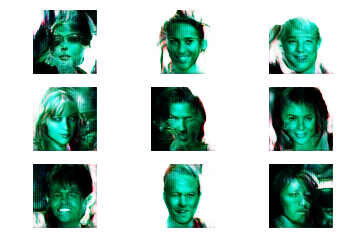

For epoch: 108, Time taken is: 172.6110725402832 seconds
10000/10000 [==============================] - 9s 904us/step
  Epoch:- 109, D LOSS: [0.32435327 0.        ]; Cummulative D_LOSS: [3.64043298e+01 5.00000000e-05]
  Epoch: 109, Generator Loss: 2.3629093567530313, Discriminator Loss: [0.32183585 0.        ]


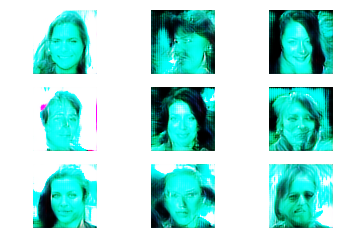

For epoch: 109, Time taken is: 172.37552666664124 seconds
10000/10000 [==============================] - 9s 917us/step
  Epoch:- 110, D LOSS: [0.31797453 0.        ]; Cummulative D_LOSS: [3.67223044e+01 5.00000000e-05]
  Epoch: 110, Generator Loss: 2.3550534064953146, Discriminator Loss: [0.31642988 0.        ]


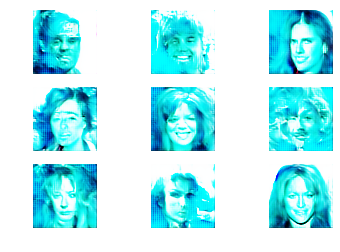

For epoch: 110, Time taken is: 172.81460523605347 seconds
10000/10000 [==============================] - 9s 907us/step
  Epoch:- 111, D LOSS: [0.318909 0.      ]; Cummulative D_LOSS: [3.70412134e+01 5.00000000e-05]
  Epoch: 111, Generator Loss: 2.3644723235032497, Discriminator Loss: [0.31988424 0.        ]


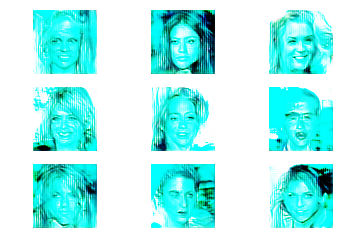

For epoch: 111, Time taken is: 172.33549332618713 seconds
10000/10000 [==============================] - 9s 912us/step
  Epoch:- 112, D LOSS: [0.32118782 0.        ]; Cummulative D_LOSS: [3.73624012e+01 5.00000000e-05]
  Epoch: 112, Generator Loss: 2.375408019774999, Discriminator Loss: [0.31379622 0.        ]


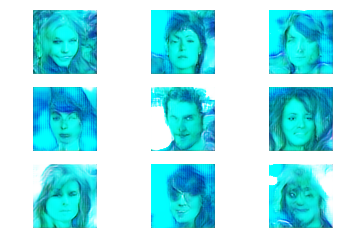

For epoch: 112, Time taken is: 172.87292194366455 seconds
10000/10000 [==============================] - 9s 907us/step
  Epoch:- 113, D LOSS: [0.32886328 0.        ]; Cummulative D_LOSS: [3.76912645e+01 5.00000000e-05]
  Epoch: 113, Generator Loss: 2.3544265987017217, Discriminator Loss: [0.32573462 0.        ]


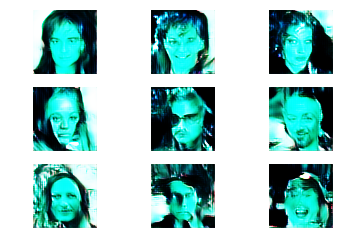

For epoch: 113, Time taken is: 172.31714797019958 seconds
10000/10000 [==============================] - 9s 909us/step
  Epoch:- 114, D LOSS: [0.32381199 0.        ]; Cummulative D_LOSS: [3.80150765e+01 5.00000000e-05]
  Epoch: 114, Generator Loss: 2.331413664878943, Discriminator Loss: [0.32863978 0.        ]


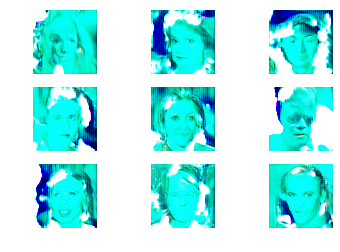

For epoch: 114, Time taken is: 172.29566621780396 seconds
10000/10000 [==============================] - 9s 904us/step
  Epoch:- 115, D LOSS: [0.32335646 0.        ]; Cummulative D_LOSS: [3.83384329e+01 5.00000000e-05]
  Epoch: 115, Generator Loss: 2.3482548869573154, Discriminator Loss: [0.32249135 0.        ]


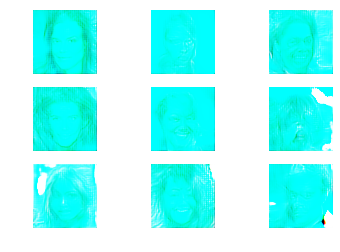

For epoch: 115, Time taken is: 172.04638481140137 seconds
10000/10000 [==============================] - 9s 916us/step
  Epoch:- 116, D LOSS: [0.32658169 0.        ]; Cummulative D_LOSS: [3.86650146e+01 5.00000000e-05]
  Epoch: 116, Generator Loss: 2.3640215610846496, Discriminator Loss: [0.32004037 0.        ]


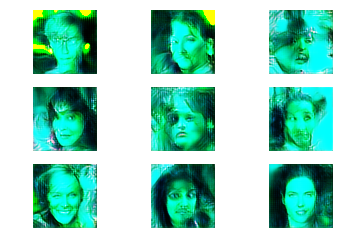

For epoch: 116, Time taken is: 172.51549220085144 seconds
10000/10000 [==============================] - 9s 905us/step
  Epoch:- 117, D LOSS: [0.329949 0.      ]; Cummulative D_LOSS: [3.89949636e+01 5.00000000e-05]
  Epoch: 117, Generator Loss: 2.3620090301220236, Discriminator Loss: [0.32663935 0.        ]


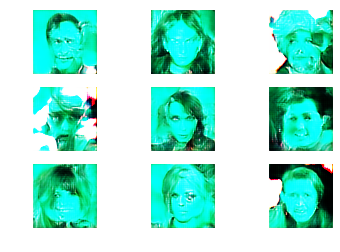

For epoch: 117, Time taken is: 172.76418352127075 seconds
10000/10000 [==============================] - 9s 912us/step
  Epoch:- 118, D LOSS: [0.32648544 0.        ]; Cummulative D_LOSS: [3.93214491e+01 5.00000000e-05]
  Epoch: 118, Generator Loss: 2.3467298043079867, Discriminator Loss: [0.3234527 0.       ]


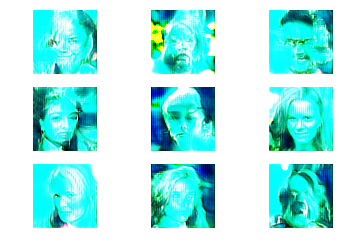

For epoch: 118, Time taken is: 172.55695819854736 seconds
10000/10000 [==============================] - 9s 912us/step
  Epoch:- 119, D LOSS: [0.32120267 0.        ]; Cummulative D_LOSS: [3.96426517e+01 5.00000000e-05]
  Epoch: 119, Generator Loss: 2.346530298391978, Discriminator Loss: [0.32431749 0.        ]


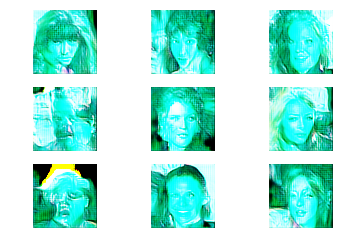

For epoch: 119, Time taken is: 172.56689262390137 seconds
10000/10000 [==============================] - 9s 914us/step
  Epoch:- 120, D LOSS: [0.33127356 0.        ]; Cummulative D_LOSS: [3.99739253e+01 5.00000000e-05]
  Epoch: 120, Generator Loss: 2.358672097707406, Discriminator Loss: [0.32331857 0.        ]


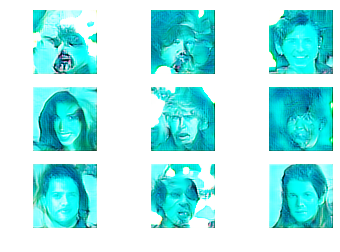

For epoch: 120, Time taken is: 172.56277012825012 seconds
10000/10000 [==============================] - 9s 904us/step
  Epoch:- 121, D LOSS: [0.72676781 0.        ]; Cummulative D_LOSS: [4.07006931e+01 5.00000000e-05]
  Epoch: 121, Generator Loss: 2.3389763556993923, Discriminator Loss: [0.32278457 0.        ]


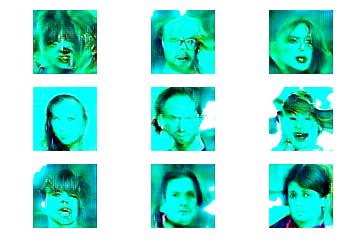

For epoch: 121, Time taken is: 172.7238929271698 seconds
10000/10000 [==============================] - 9s 907us/step
  Epoch:- 122, D LOSS: [0.31915459 0.        ]; Cummulative D_LOSS: [4.10198477e+01 5.00000000e-05]
  Epoch: 122, Generator Loss: 2.3630181489846644, Discriminator Loss: [0.32463318 0.        ]


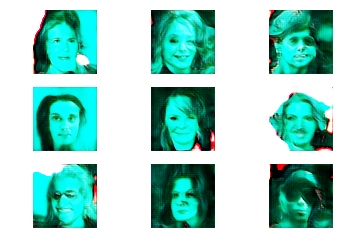

For epoch: 122, Time taken is: 172.12817406654358 seconds
10000/10000 [==============================] - 9s 896us/step
  Epoch:- 123, D LOSS: [0.32444607 0.        ]; Cummulative D_LOSS: [4.13442938e+01 5.00000000e-05]
  Epoch: 123, Generator Loss: 2.3410703264749966, Discriminator Loss: [0.32141733 0.        ]


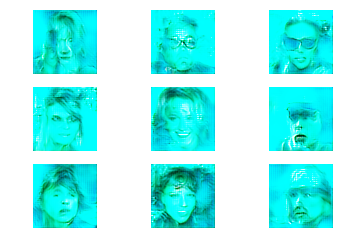

For epoch: 123, Time taken is: 171.78464794158936 seconds
10000/10000 [==============================] - 9s 916us/step
  Epoch:- 124, D LOSS: [0.32549253 0.        ]; Cummulative D_LOSS: [4.16697863e+01 5.00000000e-05]
  Epoch: 124, Generator Loss: 2.3712706443590994, Discriminator Loss: [0.32040563 0.        ]


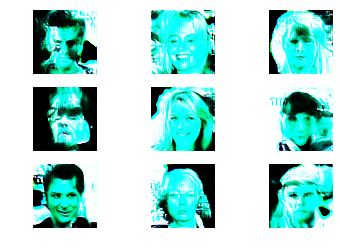

For epoch: 124, Time taken is: 172.39145922660828 seconds
10000/10000 [==============================] - 9s 893us/step
  Epoch:- 125, D LOSS: [0.32196878 0.        ]; Cummulative D_LOSS: [4.19917551e+01 5.00000000e-05]
  Epoch: 125, Generator Loss: 2.333573955755967, Discriminator Loss: [0.32280344 0.        ]


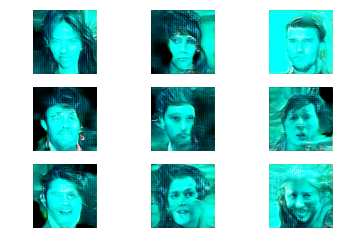

For epoch: 125, Time taken is: 171.7555787563324 seconds
10000/10000 [==============================] - 9s 904us/step
  Epoch:- 126, D LOSS: [0.32692452 0.        ]; Cummulative D_LOSS: [4.23186796e+01 5.00000000e-05]
  Epoch: 126, Generator Loss: 2.3397016464135585, Discriminator Loss: [0.32359993 0.        ]


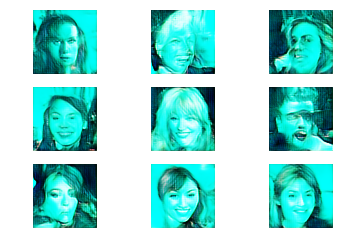

For epoch: 126, Time taken is: 172.71823048591614 seconds
10000/10000 [==============================] - 9s 904us/step
  Epoch:- 127, D LOSS: [0.32346274 0.        ]; Cummulative D_LOSS: [4.26421423e+01 5.00000000e-05]
  Epoch: 127, Generator Loss: 2.3476918737093606, Discriminator Loss: [0.32377863 0.        ]


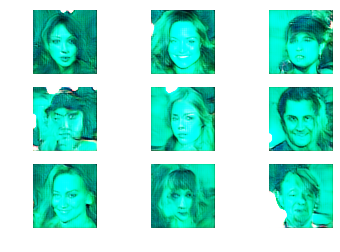

For epoch: 127, Time taken is: 172.63791275024414 seconds
10000/10000 [==============================] - 9s 900us/step
  Epoch:- 128, D LOSS: [0.32657153 0.        ]; Cummulative D_LOSS: [4.29687139e+01 5.00000000e-05]
  Epoch: 128, Generator Loss: 2.343583788627233, Discriminator Loss: [0.32494563 0.        ]


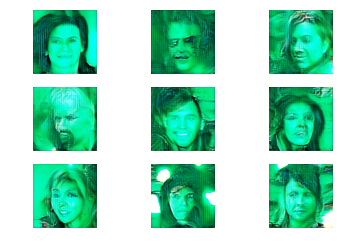

For epoch: 128, Time taken is: 171.7208423614502 seconds
10000/10000 [==============================] - 9s 901us/step
  Epoch:- 129, D LOSS: [0.3261299 0.       ]; Cummulative D_LOSS: [4.32948437e+01 5.00000000e-05]
  Epoch: 129, Generator Loss: 2.3549029506169834, Discriminator Loss: [0.3263711 0.       ]


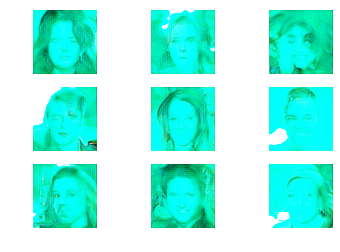

For epoch: 129, Time taken is: 171.60363388061523 seconds
10000/10000 [==============================] - 9s 906us/step
  Epoch:- 130, D LOSS: [0.32148554 0.        ]; Cummulative D_LOSS: [4.36163293e+01 5.00000000e-05]
  Epoch: 130, Generator Loss: 2.339432256344037, Discriminator Loss: [0.3230436 0.       ]


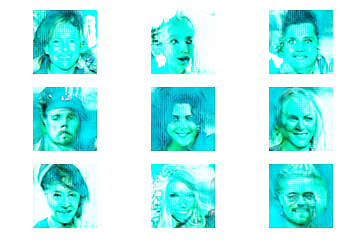

For epoch: 130, Time taken is: 171.75754237174988 seconds
10000/10000 [==============================] - 9s 902us/step
  Epoch:- 131, D LOSS: [0.32797076 0.        ]; Cummulative D_LOSS: [4.39443001e+01 5.00000000e-05]
  Epoch: 131, Generator Loss: 2.360455817137009, Discriminator Loss: [0.31926802 0.        ]


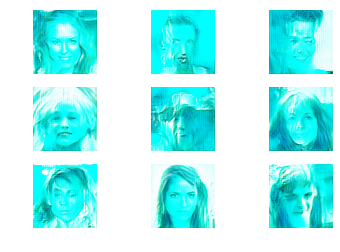

For epoch: 131, Time taken is: 171.51828050613403 seconds
10000/10000 [==============================] - 9s 903us/step
  Epoch:- 132, D LOSS: [0.32550053 0.        ]; Cummulative D_LOSS: [4.42698006e+01 5.00000000e-05]
  Epoch: 132, Generator Loss: 2.351249106419392, Discriminator Loss: [0.3232883 0.       ]


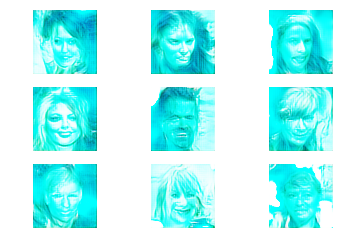

For epoch: 132, Time taken is: 171.60181069374084 seconds


In [ ]:
N_EPOCHS = 200
CUMM_DLOSS=0
for epoch in range(N_EPOCHS):
  tic=time.time()
  cum_d_loss = 0.
  cum_g_loss = 0.
  
  for batch_idx in range(num_batches):
    # Get the next set of real images to be used in this iteration
    images = X_train[batch_idx*BATCH_SIZE : (batch_idx+1)*BATCH_SIZE]

    noise_data = generate_noise(BATCH_SIZE, 100)
    generated_images = generator.predict(noise_data)

    # Train on soft labels (add noise to labels as well)
    noise_prop = 0.05 # Randomly flip 5% of labels
    
    # Prepare labels for real data
    true_labels = np.zeros((BATCH_SIZE, 1)) + np.random.uniform(low=0.0, high=0.1, size=(BATCH_SIZE, 1))
    flipped_idx = np.random.choice(np.arange(len(true_labels)), size=int(noise_prop*len(true_labels)))
    true_labels[flipped_idx] = 1 - true_labels[flipped_idx]
    
    # Train discriminator on real data
    d_loss_true = discriminator.train_on_batch(images, true_labels)

    # Prepare labels for generated data
    gene_labels = np.ones((BATCH_SIZE, 1)) - np.random.uniform(low=0.0, high=0.1, size=(BATCH_SIZE, 1))
    flipped_idx = np.random.choice(np.arange(len(gene_labels)), size=int(noise_prop*len(gene_labels)))
    gene_labels[flipped_idx] = 1 - gene_labels[flipped_idx]
    
    # Train discriminator on generated data
    d_loss_gene = discriminator.train_on_batch(generated_images, gene_labels)

    d_loss = 0.5*np.add(d_loss_true, d_loss_gene)
    cum_d_loss += d_loss
    # Train generator
    noise_data = generate_noise(BATCH_SIZE, 100)
    g_loss = gan.train_on_batch(noise_data, np.zeros((BATCH_SIZE, 1)))
    cum_g_loss += g_loss

  #for whole data:-
  IMAGES=X_train 
  Noise_Data = generate_noise(10000, 100)
  Generated_Images = generator.predict(Noise_Data)
  # Prepare labels for real data
  True_Labels = np.zeros((10000, 1)) + np.random.uniform(low=0.0, high=0.1, size=(10000, 1))
  Flipped_Idx = np.random.choice(np.arange(len(True_Labels)), size=int(noise_prop*len(True_Labels)))
  True_Labels[Flipped_Idx] = 1 - True_Labels[Flipped_Idx]
  
  # EVALUATE discriminator on real data
  DLOSS_TRUE = discriminator.evaluate(IMAGES, True_Labels) 

  # Prepare labels for generated data
  Gene_Labels = np.ones((10000, 1)) - np.random.uniform(low=0.0, high=0.1, size=(10000, 1))
  Flipped_Idx = np.random.choice(np.arange(len(Gene_Labels)), size=int(noise_prop*len(Gene_Labels)))
  Gene_Labels[Flipped_Idx] = 1 - Gene_Labels[Flipped_Idx]
    
  
  
  # EVALUTE discriminator on generated data
  D_LOSS_GENE = discriminator.evaluate(Generated_Images, Gene_Labels) 
  D_LOSS=0.5*np.add(DLOSS_TRUE,D_LOSS_GENE)
  CUMM_DLOSS+=D_LOSS
   
  print("  Epoch:- "+str(epoch+1)+", D LOSS: "+str(D_LOSS) + "; Cummulative D_LOSS: "+ str(CUMM_DLOSS) )
    
  
  noise_data = generate_noise(BATCH_SIZE, 100)
  #generated_images = generator.predict(noise_data)
  print('  Epoch: {}, Generator Loss: {}, Discriminator Loss: {}'.format(epoch+1, cum_g_loss/num_batches, cum_d_loss/num_batches))
  show_imgs("epoch" + str(epoch))
  toc=time.time()
  print("For epoch: "+ str(epoch +1)+", Time taken is: " +str(toc-tic)+ " seconds")
  #print(discriminator.predict(generated_images))
